In [1]:
# Support for maths
import numpy as np
# Plotting tools
from matplotlib import pyplot as plt
# we use the following for plotting figures in jupyter
%matplotlib inline
# Importing data library
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

# GPy: Gaussian processess libary
import GPy
from IPython.display import display

import datetime

plt.rcParams.update({'font.size': 32})

In [2]:
# Pembacaan File Data Polusi Udara ISPU Excel
DKI4 = pd.read_excel("./Data/Normalization/DATA ISPU - Normalization.xlsx", sheet_name="DKI4")

### PM10

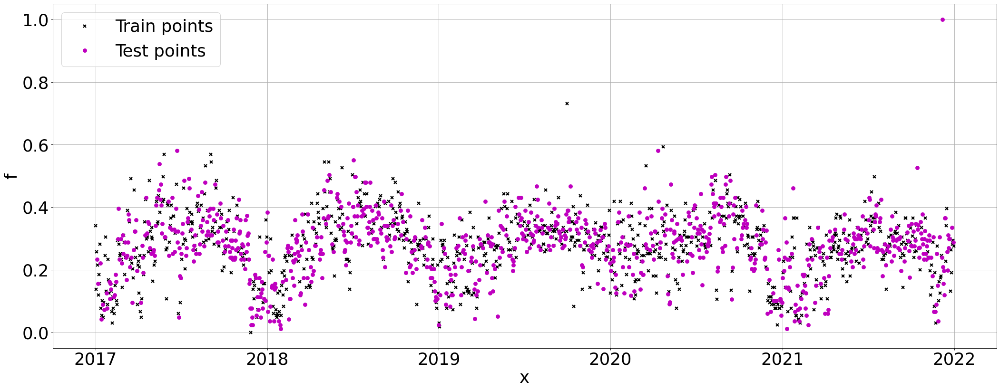

In [3]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI4.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI4['PM10']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.5, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI4['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI4['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

In [4]:
k1 = GPy.kern.StdPeriodic(1, period=2)
m1 = GPy.models.GPRegression(train_X, train_Y, k1)
m1.optimize(messages=1, ipython_notebook=True)

In [5]:
m1

GP_regression.,value,constraints,priors
std_periodic.variance,0.9861801727106229,+ve,
std_periodic.period,2.0054848600873796,+ve,
std_periodic.lengthscale,1.00873992577127,+ve,
Gaussian_noise.variance,0.007800824094036031,+ve,


In [6]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m1.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [7]:
from sklearn import metrics

def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    mape = metrics.mean_absolute_percentage_error(true,predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('MAPE:', mape)

    print('R2 Square', r2_square)
    print('__________________________________')

In [8]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m1.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.06580053620361197
MSE: 0.0073886786877098405
RMSE: 0.08595742369167331
MAPE: 0.4283796244873269
R2 Square 0.29237848720933535
__________________________________


In [9]:
metrics.r2_score(train_Y.flatten(), m1.predict(train_X)[0].flatten())

0.29089170066745895

In [10]:
# Pengambilan Data Forecasting
PM10_Index = np.arange(1826, 1857, dtype=np.int64)
PM10_Index = np.reshape(PM10_Index, (-1, 1))
PM10_Forecasting = m1.predict(PM10_Index)[0].flatten()

In [11]:
# Denormalisasi
max = 179.0
min = 12.0
PM10_Forecasting_denorm = (PM10_Forecasting.flatten() * (max - min) + min)
# PM10_Forecasting_denorm

### SO2

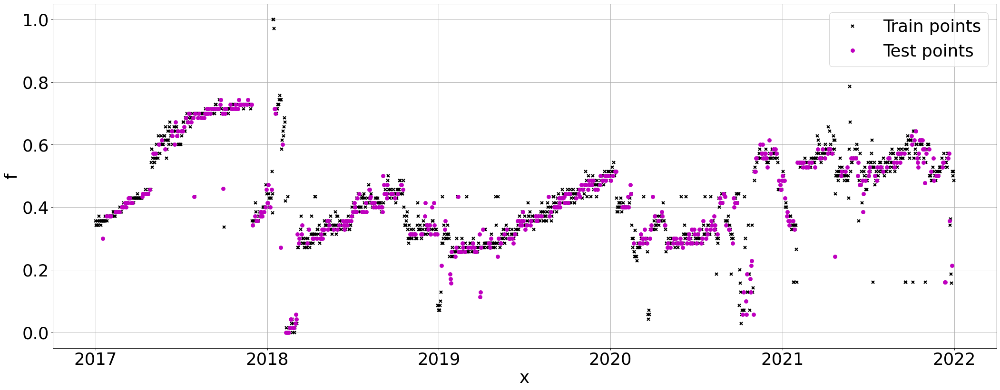

In [12]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI4.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI4['SO2']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.3, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI4['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI4['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

In [13]:
k2 = GPy.kern.StdPeriodic(1, period=2)
m2 = GPy.models.GPRegression(train_X, train_Y, k2)
m2.optimize(messages=1, ipython_notebook=True)

In [14]:
m2

GP_regression.,value,constraints,priors
std_periodic.variance,3.4757111855696365,+ve,
std_periodic.period,2.0014189771028477,+ve,
std_periodic.lengthscale,0.19623427055386944,+ve,
Gaussian_noise.variance,0.009476656234221647,+ve,


In [15]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m2.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [16]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m2.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.066418515637105
MSE: 0.010051593514136677
RMSE: 0.10025763568993973
MAPE: 10294431203919.625
R2 Square 0.5569409373297889
__________________________________


In [17]:
metrics.r2_score(train_Y.flatten(), m2.predict(train_X)[0].flatten())

0.5784589741649846

In [18]:
# Pengambilan Data Forecasting
SO2_Index = np.arange(1826, 1857, dtype=np.int64)
SO2_Index = np.reshape(SO2_Index, (-1, 1))
SO2_Forecasting = m2.predict(SO2_Index)[0].flatten()

In [19]:
# Denormalisasi
max = 72.0
min = 2.0
SO2_Forecasting_denorm = (SO2_Forecasting.flatten() * (max - min) + min)
# SO2_Forecasting_denorm

### CO

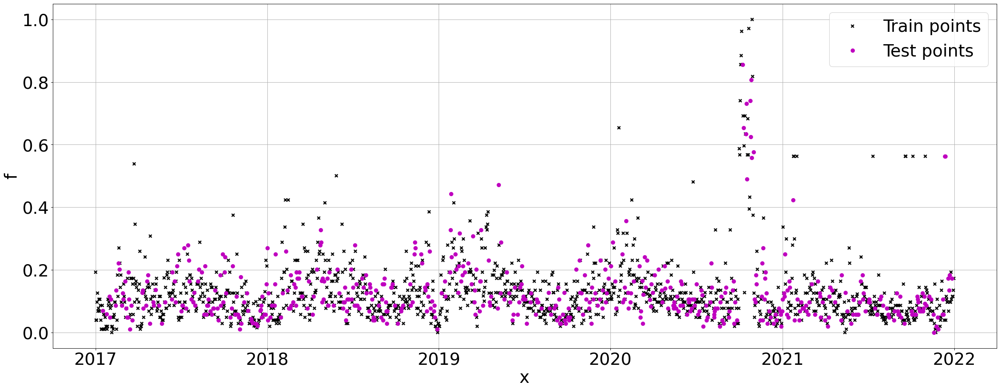

In [20]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI4.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI4['CO']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.3, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI4['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI4['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

In [21]:
k3 = GPy.kern.StdPeriodic(1, period=2)
m3 = GPy.models.GPRegression(train_X, train_Y, k3)
m3.optimize(messages=1, ipython_notebook=True)

In [22]:
m3

GP_regression.,value,constraints,priors
std_periodic.variance,0.5231198357794035,+ve,
std_periodic.period,1.993448443936515,+ve,
std_periodic.lengthscale,2.1145976866204492,+ve,
Gaussian_noise.variance,0.011420489657464566,+ve,


In [23]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m3.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [24]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m3.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.0648436914852287
MSE: 0.010265661140521666
RMSE: 0.10131959899506938
MAPE: 1099734172609.1558
R2 Square 0.06619566281386702
__________________________________


In [25]:
metrics.r2_score(train_Y.flatten(), m3.predict(train_X)[0].flatten())

0.06568425556242763

In [26]:
# Pengambilan Data Forecasting
CO_Index = np.arange(1826, 1857, dtype=np.int64)
CO_Index = np.reshape(CO_Index, (-1, 1))
CO_Forecasting = m2.predict(CO_Index)[0].flatten()

In [27]:
# Denormalisasi
max = 107.0
min = 3.0
CO_Forecasting_denorm = (CO_Forecasting.flatten() * (max - min) + min)
# CO_Forecasting_denorm

### O3

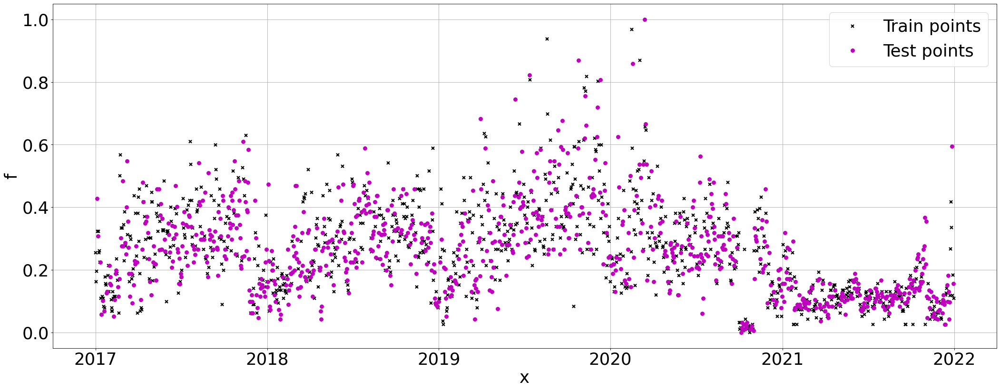

In [28]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI4.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI4['O3']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.5, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI4['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI4['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

In [29]:
k4 = GPy.kern.StdPeriodic(1, period=2)
m4 = GPy.models.GPRegression(train_X, train_Y, k4)
m4.optimize(messages=1, ipython_notebook=True)

In [30]:
m4

GP_regression.,value,constraints,priors
std_periodic.variance,1.0545917016057227,+ve,
std_periodic.period,1.998961651589627,+ve,
std_periodic.lengthscale,0.5775376360650993,+ve,
Gaussian_noise.variance,0.014660200620816261,+ve,


In [31]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m4.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [32]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m4.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.08809205072227874
MSE: 0.013721181908756224
RMSE: 0.11713744878883194
MAPE: 1035470413427.3329
R2 Square 0.3353451161233296
__________________________________


In [33]:
metrics.r2_score(train_Y.flatten(), m4.predict(train_X)[0].flatten())

0.3655554347283132

In [34]:
# Pengambilan Data Forecasting
O3_Index = np.arange(1826, 1857, dtype=np.int64)
O3_Index = np.reshape(O3_Index, (-1, 1))
O3_Forecasting = m2.predict(O3_Index)[0].flatten()

In [35]:
# Denormalisasi
max = 197.0
min = 5.0
O3_Forecasting_denorm = (O3_Forecasting.flatten() * (max - min) + min)
# O3_Forecasting_denorm

### NO2

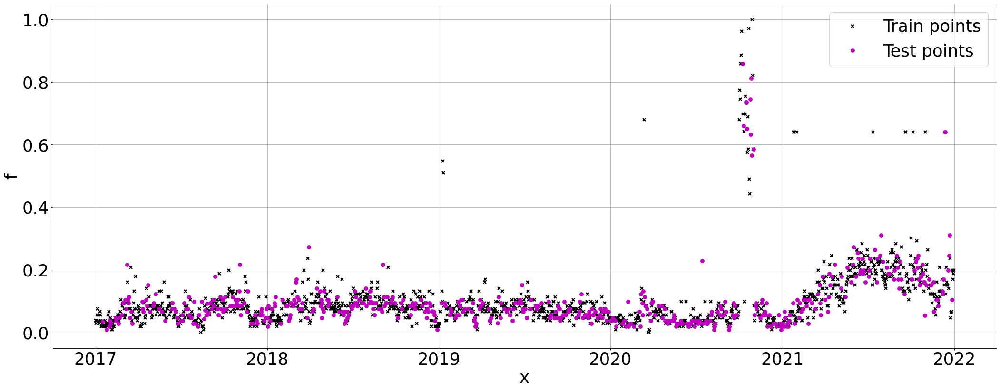

In [36]:
# X = np.array(DKI1.Tanggal.astype('int64') // 10**9)
X = np.array(DKI4.index).reshape(-1,1)
# X = np.array(DKI1['Tanggal']).reshape(-1,1)
Y = np.array(DKI4['NO2']).reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.3, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI4['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI4['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

In [37]:
k5 = GPy.kern.StdPeriodic(1, period=2)
m5 = GPy.models.GPRegression(train_X, train_Y, k5)
m5.optimize(messages=1, ipython_notebook=True)

In [38]:
m5

GP_regression.,value,constraints,priors
std_periodic.variance,0.009886906907242433,+ve,
std_periodic.period,1.9995271504086407,+ve,
std_periodic.lengthscale,0.1692574479558995,+ve,
Gaussian_noise.variance,0.010133454381004587,+ve,


In [39]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m5.plot()
ax = plt.gca()
# ax.plot(train_X, train_Y, color="green", mew=2, label="Train points")
# ax.plot(test_X, test_Y, color="orange", mew=2, label="Test points")
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [40]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y.flatten(), m5.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.04809759484015723
MSE: 0.009228759986310025
RMSE: 0.09606643527429351
MAPE: 0.837061350428853
R2 Square 0.14687357468022477
__________________________________


In [41]:
metrics.r2_score(train_Y.flatten(), m5.predict(train_X)[0].flatten())

0.1652678554608379

In [42]:
# Pengambilan Data Forecasting
NO2_Index = np.arange(1826, 1857, dtype=np.int64)
NO2_Index = np.reshape(NO2_Index, (-1, 1))
NO2_Forecasting = m2.predict(NO2_Index)[0].flatten()

In [43]:
# Denormalisasi
max = 107.0
min = 1.0
NO2_Forecasting_denorm = (NO2_Forecasting.flatten() * (max - min) + min)
# NO2_Forecasting_denorm

### Saving File

In [44]:
start = datetime.datetime.strptime("2022-01-01", "%Y-%m-%d")
date_generated = pd.date_range(start, periods=31)
# print(date_generated.strftime("%Y-%m-%d"))
date_generated

DatetimeIndex(['2022-01-01', '2022-01-02', '2022-01-03', '2022-01-04',
               '2022-01-05', '2022-01-06', '2022-01-07', '2022-01-08',
               '2022-01-09', '2022-01-10', '2022-01-11', '2022-01-12',
               '2022-01-13', '2022-01-14', '2022-01-15', '2022-01-16',
               '2022-01-17', '2022-01-18', '2022-01-19', '2022-01-20',
               '2022-01-21', '2022-01-22', '2022-01-23', '2022-01-24',
               '2022-01-25', '2022-01-26', '2022-01-27', '2022-01-28',
               '2022-01-29', '2022-01-30', '2022-01-31'],
              dtype='datetime64[ns]', freq='D')

In [45]:
d = {"Tanggal":date_generated, "PM10":PM10_Forecasting_denorm, "SO2":SO2_Forecasting_denorm, "CO":CO_Forecasting_denorm, "O3":O3_Forecasting_denorm, "NO2":NO2_Forecasting_denorm}
DKI4_Forecasting = pd.DataFrame(d)
DKI4_Forecasting

,Tanggal,PM10,SO2,CO,O3,NO2
0,2022-01-01,45.477335,30.427168,45.234649,82.971660,44.046854
1,2022-01-02,44.276812,28.817677,42.843406,78.557056,41.609625
2,2022-01-03,45.289248,30.102655,44.752516,82.081567,43.555449
3,2022-01-04,44.056211,28.480092,42.341851,77.631109,41.098425
4,2022-01-05,45.121876,29.782295,44.276553,81.202867,43.070333
5,2022-01-06,43.859684,28.149189,41.850223,76.723489,40.597343
6,2022-01-07,44.975416,29.466552,43.807448,80.336827,42.592207
7,2022-01-08,43.687554,27.825426,41.369205,75.835455,40.107074
8,2022-01-09,44.850009,29.155883,43.345883,79.484707,42.121765
9,2022-01-10,43.540081,27.509253,40.899461,74.968237,39.628297


In [46]:
# Penyimpanan Data Forecasting
DKI4_Forecasting.to_excel('./Data/Forecasting/DKI4_Forecasting.xlsx', index=False)